In [47]:
from PIL import Image
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [48]:
import sys
sys.version

'2.7.15 |Anaconda, Inc.| (default, Oct 10 2018, 21:32:13) \n[GCC 7.3.0]'

In [49]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

['/job:localhost/replica:0/task:0/device:GPU:0']

In [50]:
def load_image(dirname, file):
    arr = np.array(Image.open('./' + dirname + '/' + file + '.jpg').convert('L'))
    return arr.reshape(400, 300, 1)

In [51]:
dataset = pd.read_csv('./dataset.csv')
dataset['image'] = dataset.apply(lambda x: load_image('images', x.file), axis=1)
dataset['label'] = dataset.apply(lambda x: np.array([x.country == 'ru', x.country == 'uk']), axis=1)
dataset.iloc[0].image.shape

(400, 300, 1)

In [52]:
from keras.models import Sequential
from keras.layers import Dense, Activation, Conv2D, MaxPooling2D, BatchNormalization, Dropout, Flatten

N_IMAGES = len(dataset)
IMG_W = 400
IMG_H = 300

model = Sequential()

model.add(Conv2D(32, kernel_size=(3, 3), use_bias=False, input_shape=(IMG_W, IMG_H, 1)))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(64, kernel_size=(3,3), use_bias=False))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(64, kernel_size=(3,3), use_bias=False))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(128, kernel_size=(3,3), use_bias=False))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(64, kernel_size=(3,3), use_bias=False))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Conv2D(32, kernel_size=(3,3), use_bias=False))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dropout(0.2))
model.add(Flatten())

model.add(Dense(128, use_bias=False))
model.add(BatchNormalization())
model.add(Activation('relu'))

model.add(Dense(2, use_bias=False))
model.add(BatchNormalization())
model.add(Activation('softmax'))

In [53]:
dataset['image'].iloc[0].shape

(400, 300, 1)

In [54]:
from keras import optimizers
from keras import losses

model.compile(loss=losses.mean_squared_error, optimizer='sgd')

In [55]:
x = np.array(dataset['image'].tolist())
y = np.array(dataset['label'].tolist())
print('x shape is', x.shape)
print('y shape is', y.shape)

('x shape is', (4672, 400, 300, 1))
('y shape is', (4672, 2))


In [57]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping, ModelCheckpoint

# set early stopping criteria
patience = 5 # this is the number of epochs with no improvement after which the training will stop
early_stopping = EarlyStopping(monitor='val_loss', patience=patience, verbose=1)

#define the model checkpoint callback -> this will keep on saving the model as a physical file
model_checkpoint = ModelCheckpoint('./checkpoint.h5', verbose=1, save_best_only=True)

n_folds = 3
epochs = 10
batch_size = 10
model_history = []

def fit_and_evaluate(t_x, val_x, t_y, val_y, used_epochs, used_batch_size):
    results = model.fit(t_x, t_y, epochs=used_epochs, batch_size=used_batch_size, callbacks=[early_stopping, model_checkpoint], 
              verbose=1, validation_split=0.1)  
    print("Validation Score: ", model.evaluate(val_x, val_y))
    return results

for i in range(n_folds):
    print("Training on fold: ", i+1)
    t_x, val_x, t_y, val_y = train_test_split(x, y, test_size=0.1, random_state = np.random.randint(1,1000, 1)[0])
    model_history.append(fit_and_evaluate(t_x, val_x, t_y, val_y, epochs, batch_size))
    print("=======" * 12 + "\n\n\n")

('Training on fold: ', 1)
Train on 3783 samples, validate on 421 samples
Epoch 1/10
3783/3783 [==============================] - 66s 17ms/step - loss: 0.2255 - val_loss: 0.2252

Epoch 00001: val_loss improved from inf to 0.22520, saving model to ./checkpoint.h5
Epoch 2/10
3783/3783 [==============================] - 62s 16ms/step - loss: 0.2042 - val_loss: 0.2000

Epoch 00002: val_loss improved from 0.22520 to 0.19998, saving model to ./checkpoint.h5
Epoch 3/10
3783/3783 [==============================] - 59s 16ms/step - loss: 0.1989 - val_loss: 0.2133

Epoch 00003: val_loss did not improve from 0.19998
Epoch 4/10
3783/3783 [==============================] - 60s 16ms/step - loss: 0.1924 - val_loss: 0.2041

Epoch 00004: val_loss did not improve from 0.19998
Epoch 5/10
3783/3783 [==============================] - 62s 16ms/step - loss: 0.1849 - val_loss: 0.2077

Epoch 00005: val_loss did not improve from 0.19998
Epoch 6/10
3783/3783 [==============================] - 57s 15ms/step - loss:

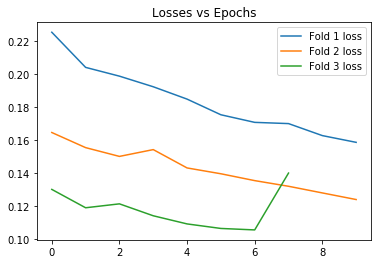

In [58]:
plt.title('Losses vs Epochs')
plt.plot(model_history[0].history['loss'], label='Fold 1 loss')
plt.plot(model_history[1].history['loss'], label='Fold 2 loss')
plt.plot(model_history[2].history['loss'], label='Fold 3 loss')
plt.legend()
plt.show()

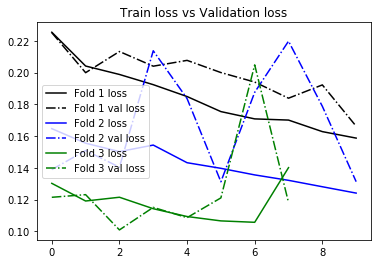

In [92]:
# Validation loss must not rise!
plt.title('Train loss vs Validation loss')
plt.plot(model_history[0].history['loss'], label='Fold 1 loss', color='black')
plt.plot(model_history[0].history['val_loss'], label='Fold 1 val loss', color='black', linestyle = "dashdot")
plt.plot(model_history[1].history['loss'], label='Fold 2 loss', color='blue')
plt.plot(model_history[1].history['val_loss'], label='Fold 2 val loss', color='blue', linestyle = "dashdot")
plt.plot(model_history[2].history['loss'], label='Fold 3 loss', color='green')
plt.plot(model_history[2].history['val_loss'], label='Fold 3 val loss', color='green', linestyle = "dashdot")
plt.legend()
plt.show()

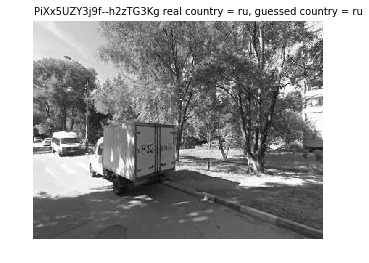

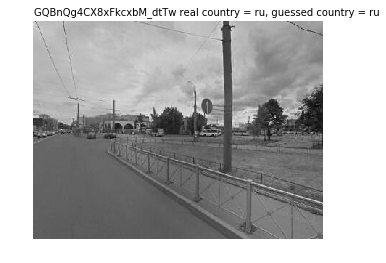

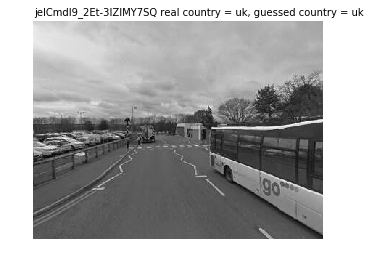

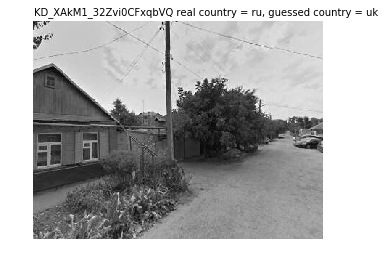

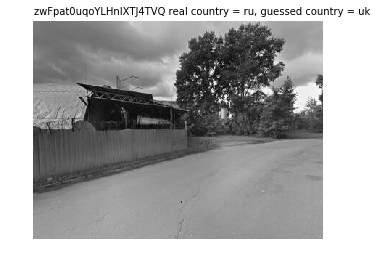

...

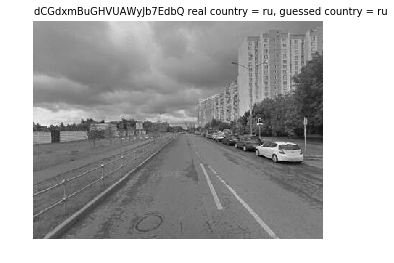

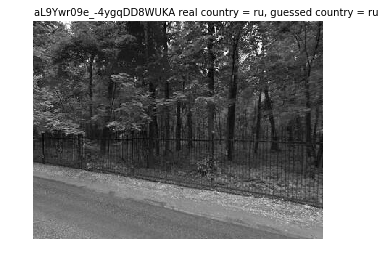

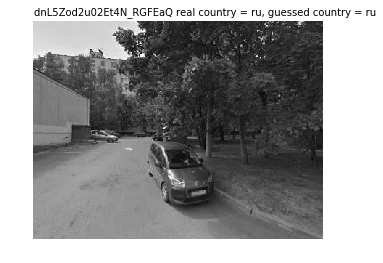

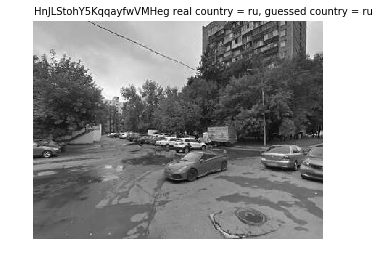

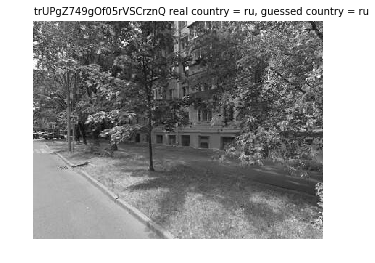

In [103]:
test_images = pd.read_csv('./dataset_test.csv')

predictions = []
guesses = 0

for index, row in test_images.iterrows():
    image = row['file']
    real_country = row['country']
    
    test_image = load_image('images_test', image)
    prediction = model.predict(test_image.reshape(1, 400, 300, 1))
    if prediction[0][0] > 0.50:
        guessed_country = 'ru'
    elif prediction[0][1] > 0.50:
        guessed_country = 'uk'
    else:
        guessed_country = None
    
    if guessed_country == real_country:
        guesses += 1
    elif guessed_country is None:
        unidentified += 1
          
    plt.imshow(Image.open('./images_test/' + image + '.jpg'), cmap="inferno")
    plt.text(0, -10, image + " real country = " + real_country + ", guessed country = " + guessed_country)
    plt.axis('off')
    plt.show()

In [104]:
print 'Угадано:', guesses
print 'Всего:', len(test_images)
print 'Точность:', guesses / float(len(test_images)) * 100, '%'

Угадано: 120
Всего: 180
Точность: 66.6666666667 %
